### Import some system libs

In [240]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from textblob import TextBlob
import talib as tl
import plotly.express as pe
import sys
import os

#### Load the dataset using the local .env 

In [241]:
sys.path.append('../scripts/')

from dotenv import load_dotenv
from load_data import load_csv
load_dotenv()
apple_data = os.getenv('APPLE_STOCK')
amazon_data = os.getenv('AMAZON_STOCK')
google_data = os.getenv('GOOGLE_STOCK')
meta_data = os.getenv('META_STOCK')
microsoft_data = os.getenv('MICROSOFT_STOCK')
nvdia_data = os.getenv('NVIDIA_STOCK')
tesla_data = os.getenv('TESLA_STOCK')

apple_data_df = load_csv(apple_data)
amazon_data_df = load_csv(amazon_data)
google_data_df = load_csv(google_data)
meta_data_df = load_csv(meta_data)
microsoft_data_df = load_csv(microsoft_data)
nvdia_data_df = load_csv(nvdia_data)
tesla_data_df = load_csv(tesla_data)
if apple_data_df is not None and amazon_data_df is not None and google_data_df is not None and meta_data_df is not None and microsoft_data_df is not None and nvdia_data_df is not None and tesla_data_df is not None:
    print(f"Data loaded successfully with {len(apple_data_df)} Apple records.")
    print(f"Data loaded successfully with {len(amazon_data_df)} Amazon records.")
    print(f"Data loaded successfully with {len(google_data_df)} Google records.")
    print(f"Data loaded successfully with {len(meta_data_df)} Meta records.")
    print(f"Data loaded successfully with {len(microsoft_data_df)} Microsoft records.")
    print(f"Data loaded successfully with {len(nvdia_data_df)} NVDIA records.")
    print(f"Data loaded successfully with {len(tesla_data_df)} TESLA records.")

Data loaded successfully with 10998 Apple records.
Data loaded successfully with 6846 Amazon records.
Data loaded successfully with 5020 Google records.
Data loaded successfully with 2926 Meta records.
Data loaded successfully with 9672 Microsoft records.
Data loaded successfully with 6421 NVDIA records.
Data loaded successfully with 3545 TESLA records.


### Historical Data for the Companies Apple, Google, Tesla, Microsoft, NVDIA, Amazon, META

In [242]:
apple_data_df['stock']='AAPL'
amazon_data_df['stock']='AMZN'
google_data_df['stock']='GOOG'
meta_data_df['stock']='FB'
microsoft_data_df['stock']='MSF'
nvdia_data_df['stock'] = "NVDA"
tesla_data_df['stock'] = "TSLA"

In [243]:
print('APPLE DATA')
apple_data_df.head()

APPLE DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,1980-12-12,0.128348,0.128906,0.128348,0.128348,0.098943,469033600,0.0,0.0,AAPL
1,1980-12-15,0.122210,0.122210,0.121652,0.121652,0.093781,175884800,0.0,0.0,AAPL
2,1980-12-16,0.113281,0.113281,0.112723,0.112723,0.086898,105728000,0.0,0.0,AAPL
3,1980-12-17,0.115513,0.116071,0.115513,0.115513,0.089049,86441600,0.0,0.0,AAPL
4,1980-12-18,0.118862,0.119420,0.118862,0.118862,0.091630,73449600,0.0,0.0,AAPL


In [244]:
print('AMAZON DATA')
amazon_data_df.head()

AMAZON DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,1997-05-15,0.121875,0.125000,0.096354,0.097917,0.097917,1443120000,0.0,0.0,AMZN
1,1997-05-16,0.098438,0.098958,0.085417,0.086458,0.086458,294000000,0.0,0.0,AMZN
2,1997-05-19,0.088021,0.088542,0.081250,0.085417,0.085417,122136000,0.0,0.0,AMZN
3,1997-05-20,0.086458,0.087500,0.081771,0.081771,0.081771,109344000,0.0,0.0,AMZN
4,1997-05-21,0.081771,0.082292,0.068750,0.071354,0.071354,377064000,0.0,0.0,AMZN


In [245]:
print('GOOGLE DATA')
google_data_df.head()

GOOGLE DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,2004-08-19,2.490664,2.591785,2.390042,2.499133,2.496292,897427216,0.0,0.0,GOOG
1,2004-08-20,2.515820,2.716817,2.503118,2.697639,2.694573,458857488,0.0,0.0,GOOG
2,2004-08-23,2.758411,2.826406,2.716070,2.724787,2.721690,366857939,0.0,0.0,GOOG
3,2004-08-24,2.770615,2.779581,2.579581,2.611960,2.608991,306396159,0.0,0.0,GOOG
4,2004-08-25,2.614201,2.689918,2.587302,2.640104,2.637103,184645512,0.0,0.0,GOOG


In [246]:
print('META DATA')
meta_data_df.head()

META DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,2012-12-12,28.000000,28.139999,27.370001,27.580000,27.523441,46704200,0.0,0.0,FB
1,2012-12-13,27.590000,28.750000,27.430000,28.240000,28.182087,81051600,0.0,0.0,FB
2,2012-12-14,28.180000,28.330000,26.760000,26.809999,26.755020,91631600,0.0,0.0,FB
3,2012-12-17,26.770000,27.000000,26.320000,26.750000,26.695143,57742500,0.0,0.0,FB
4,2012-12-18,26.959999,27.910000,26.900000,27.709999,27.653173,60512900,0.0,0.0,FB


In [247]:
print('MICROSOFT DATA')
microsoft_data_df.head()

MICROSOFT DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.059946,1031788800,0.0,0.0,MSF
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062087,308160000,0.0,0.0,MSF
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063158,133171200,0.0,0.0,MSF
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061552,67766400,0.0,0.0,MSF
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.060482,47894400,0.0,0.0,MSF


In [248]:
print('NVDIA DATA')
nvdia_data_df.head()

NVDIA DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,1999-01-22,0.043750,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0,NVDA
1,1999-01-25,0.044271,0.045833,0.041016,0.045313,0.041562,510480000,0.0,0.0,NVDA
2,1999-01-26,0.045833,0.046745,0.041146,0.041797,0.038337,343200000,0.0,0.0,NVDA
3,1999-01-27,0.041927,0.042969,0.039583,0.041667,0.038218,244368000,0.0,0.0,NVDA
4,1999-01-28,0.041667,0.041927,0.041276,0.041536,0.038098,227520000,0.0,0.0,NVDA


In [249]:
print('TESLA DATA')
tesla_data_df.head()

TESLA DATA


,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,2010-06-29,1.266667,1.666667,1.169333,1.592667,1.592667,281494500,0.0,0.0,TSLA
1,2010-06-30,1.719333,2.028000,1.553333,1.588667,1.588667,257806500,0.0,0.0,TSLA
2,2010-07-01,1.666667,1.728000,1.351333,1.464000,1.464000,123282000,0.0,0.0,TSLA
3,2010-07-02,1.533333,1.540000,1.247333,1.280000,1.280000,77097000,0.0,0.0,TSLA
4,2010-07-06,1.333333,1.333333,1.055333,1.074000,1.074000,103003500,0.0,0.0,TSLA


In [250]:
from sentimental_analysis import combine_dataframes_checking_missing_values

combined_df = combine_dataframes_checking_missing_values(apple_data_df,amazon_data_df,google_data_df,meta_data_df,microsoft_data_df,nvdia_data_df,tesla_data_df)


In [251]:
combined_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock
0,1980-12-12,0.128348,0.128906,0.128348,0.128348,0.098943,469033600,0.0,0.0,AAPL
1,1980-12-15,0.122210,0.122210,0.121652,0.121652,0.093781,175884800,0.0,0.0,AAPL
2,1980-12-16,0.113281,0.113281,0.112723,0.112723,0.086898,105728000,0.0,0.0,AAPL
3,1980-12-17,0.115513,0.116071,0.115513,0.115513,0.089049,86441600,0.0,0.0,AAPL
4,1980-12-18,0.118862,0.119420,0.118862,0.118862,0.091630,73449600,0.0,0.0,AAPL


#### Descriptive Statistics on Combined Data

In [252]:
from tabulate import tabulate
from sentimental_analysis import calculate_Descriptive_Statistics_Historical_Data
statisticsOfHistoricalData = calculate_Descriptive_Statistics_Historical_Data(apple_data_df,amazon_data_df,google_data_df,meta_data_df,microsoft_data_df,nvdia_data_df,tesla_data_df)
print(tabulate(statisticsOfHistoricalData, headers='keys', tablefmt='psql'))

+-------+--------------+------------+-------------+-------------+-----------+-------------+------------+
|       |         AAPL |       GOOG |        AMZN |        MSFT |      META |        NVDA |       TSLA |
|-------+--------------+------------+-------------+-------------+-----------+-------------+------------|
| count | 10998        | 5020       | 6846        | 9672        | 2926      | 6421        | 3545       |
| mean  |    22.3128   |   45.2745  |   37.3511   |   58.4177   |  179.649  |    6.2077   |   75.4873  |
| std   |    46.0377   |   43.3773  |   53.7299   |   90.1468   |  108.907  |   16.1185   |  102.457   |
| min   |     0.049107 |    2.49091 |    0.069792 |    0.090278 |   22.9    |    0.034115 |    1.05333 |
| 25%   |     0.298549 |   13.0321  |    2.07675  |    5.69531  |   97.3825 |    0.27675  |   11.5653  |
| 50%   |     0.53125  |   27.0059  |    8.5915   |   27.3419   |  166.855  |    0.457    |   17.4593  |
| 75%   |    20.1962   |   60.2803  |   50.4265   |   4

In [253]:
apple_data_df['Date']=pd.to_datetime(apple_data_df['Date'])
amazon_data_df['Date']=pd.to_datetime(amazon_data_df['Date'])
google_data_df['Date']=pd.to_datetime(google_data_df['Date'])
meta_data_df['Date']=pd.to_datetime(meta_data_df['Date'])
microsoft_data_df['Date']=pd.to_datetime(microsoft_data_df['Date'])
nvdia_data_df['Date']=pd.to_datetime(nvdia_data_df['Date'])
tesla_data_df['Date']=pd.to_datetime(tesla_data_df['Date'])


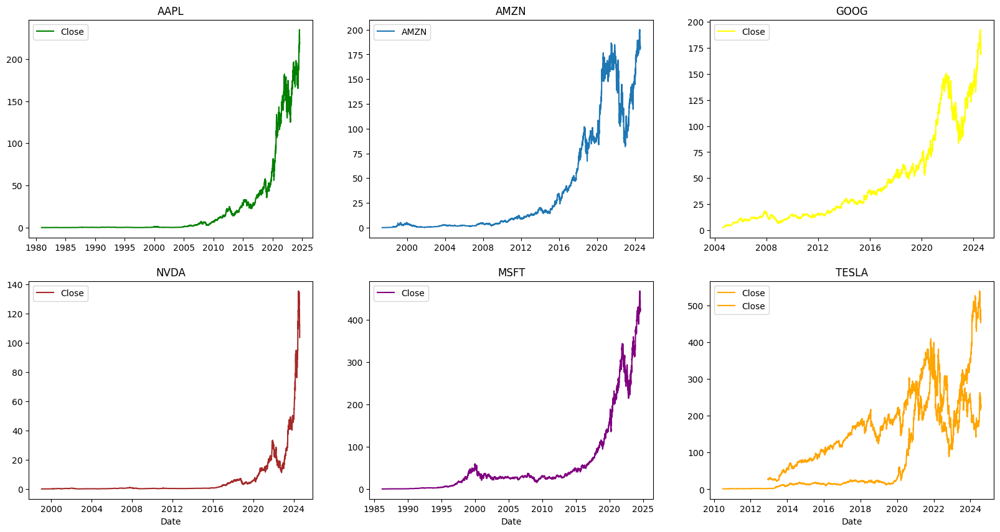

In [254]:
from sentimental_analysis import analysisClosingPriceWithDate
analysisClosingPriceWithDate(apple_data_df,amazon_data_df,google_data_df,meta_data_df,microsoft_data_df,nvdia_data_df,tesla_data_df)

## TA-Lib - Technical Analysis using Talib

### Calculate the technical indicators

In [255]:
from sentimental_analysis import calculateTechnicalIndicator

#### Calculating technical indicator for Apple

In [256]:
calculateTechnicalIndicator(apple_data_df)
apple_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,1980-12-12,0.128348,0.128906,0.128348,0.128348,0.098943,469033600,0.0,0.0,AAPL,NaN,NaN,NaN,NaN,NaN
1,1980-12-15,0.122210,0.122210,0.121652,0.121652,0.093781,175884800,0.0,0.0,AAPL,NaN,NaN,NaN,NaN,NaN
2,1980-12-16,0.113281,0.113281,0.112723,0.112723,0.086898,105728000,0.0,0.0,AAPL,NaN,NaN,NaN,NaN,NaN
3,1980-12-17,0.115513,0.116071,0.115513,0.115513,0.089049,86441600,0.0,0.0,AAPL,NaN,NaN,NaN,NaN,NaN
4,1980-12-18,0.118862,0.119420,0.118862,0.118862,0.091630,73449600,0.0,0.0,AAPL,NaN,NaN,NaN,NaN,NaN


#### Calculating technical indicator for Amazon

In [257]:
calculateTechnicalIndicator(amazon_data_df)
amazon_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,1997-05-15,0.121875,0.125000,0.096354,0.097917,0.097917,1443120000,0.0,0.0,AMZN,NaN,NaN,NaN,NaN,NaN
1,1997-05-16,0.098438,0.098958,0.085417,0.086458,0.086458,294000000,0.0,0.0,AMZN,NaN,NaN,NaN,NaN,NaN
2,1997-05-19,0.088021,0.088542,0.081250,0.085417,0.085417,122136000,0.0,0.0,AMZN,NaN,NaN,NaN,NaN,NaN
3,1997-05-20,0.086458,0.087500,0.081771,0.081771,0.081771,109344000,0.0,0.0,AMZN,NaN,NaN,NaN,NaN,NaN
4,1997-05-21,0.081771,0.082292,0.068750,0.071354,0.071354,377064000,0.0,0.0,AMZN,NaN,NaN,NaN,NaN,NaN


#### Calculating technical indicator for Google

In [258]:
calculateTechnicalIndicator(google_data_df)
google_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,2004-08-19,2.490664,2.591785,2.390042,2.499133,2.496292,897427216,0.0,0.0,GOOG,NaN,NaN,NaN,NaN,NaN
1,2004-08-20,2.515820,2.716817,2.503118,2.697639,2.694573,458857488,0.0,0.0,GOOG,NaN,NaN,NaN,NaN,NaN
2,2004-08-23,2.758411,2.826406,2.716070,2.724787,2.721690,366857939,0.0,0.0,GOOG,NaN,NaN,NaN,NaN,NaN
3,2004-08-24,2.770615,2.779581,2.579581,2.611960,2.608991,306396159,0.0,0.0,GOOG,NaN,NaN,NaN,NaN,NaN
4,2004-08-25,2.614201,2.689918,2.587302,2.640104,2.637103,184645512,0.0,0.0,GOOG,NaN,NaN,NaN,NaN,NaN


#### Calculating technical indicator for META

In [259]:
calculateTechnicalIndicator(meta_data_df)
meta_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,2012-12-12,28.000000,28.139999,27.370001,27.580000,27.523441,46704200,0.0,0.0,FB,NaN,NaN,NaN,NaN,NaN
1,2012-12-13,27.590000,28.750000,27.430000,28.240000,28.182087,81051600,0.0,0.0,FB,NaN,NaN,NaN,NaN,NaN
2,2012-12-14,28.180000,28.330000,26.760000,26.809999,26.755020,91631600,0.0,0.0,FB,NaN,NaN,NaN,NaN,NaN
3,2012-12-17,26.770000,27.000000,26.320000,26.750000,26.695143,57742500,0.0,0.0,FB,NaN,NaN,NaN,NaN,NaN
4,2012-12-18,26.959999,27.910000,26.900000,27.709999,27.653173,60512900,0.0,0.0,FB,NaN,NaN,NaN,NaN,NaN


#### Calculating technical indicator for Microsoft

In [260]:
calculateTechnicalIndicator(microsoft_data_df)
microsoft_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.059946,1031788800,0.0,0.0,MSF,NaN,NaN,NaN,NaN,NaN
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062087,308160000,0.0,0.0,MSF,NaN,NaN,NaN,NaN,NaN
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063158,133171200,0.0,0.0,MSF,NaN,NaN,NaN,NaN,NaN
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061552,67766400,0.0,0.0,MSF,NaN,NaN,NaN,NaN,NaN
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.060482,47894400,0.0,0.0,MSF,NaN,NaN,NaN,NaN,NaN


#### Calculating technical indicator for NVDIA

In [261]:
calculateTechnicalIndicator(nvdia_data_df)
nvdia_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,1999-01-22,0.043750,0.048828,0.038802,0.041016,0.037621,2714688000,0.0,0.0,NVDA,NaN,NaN,NaN,NaN,NaN
1,1999-01-25,0.044271,0.045833,0.041016,0.045313,0.041562,510480000,0.0,0.0,NVDA,NaN,NaN,NaN,NaN,NaN
2,1999-01-26,0.045833,0.046745,0.041146,0.041797,0.038337,343200000,0.0,0.0,NVDA,NaN,NaN,NaN,NaN,NaN
3,1999-01-27,0.041927,0.042969,0.039583,0.041667,0.038218,244368000,0.0,0.0,NVDA,NaN,NaN,NaN,NaN,NaN
4,1999-01-28,0.041667,0.041927,0.041276,0.041536,0.038098,227520000,0.0,0.0,NVDA,NaN,NaN,NaN,NaN,NaN


#### Calculating technical indicator for TESLA

In [262]:
calculateTechnicalIndicator(tesla_data_df)
tesla_data_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,stock,SMA,RSI,EMA,MACD,MACD_Signal
0,2010-06-29,1.266667,1.666667,1.169333,1.592667,1.592667,281494500,0.0,0.0,TSLA,NaN,NaN,NaN,NaN,NaN
1,2010-06-30,1.719333,2.028000,1.553333,1.588667,1.588667,257806500,0.0,0.0,TSLA,NaN,NaN,NaN,NaN,NaN
2,2010-07-01,1.666667,1.728000,1.351333,1.464000,1.464000,123282000,0.0,0.0,TSLA,NaN,NaN,NaN,NaN,NaN
3,2010-07-02,1.533333,1.540000,1.247333,1.280000,1.280000,77097000,0.0,0.0,TSLA,NaN,NaN,NaN,NaN,NaN
4,2010-07-06,1.333333,1.333333,1.055333,1.074000,1.074000,103003500,0.0,0.0,TSLA,NaN,NaN,NaN,NaN,NaN


### Showing Technical Indicators with Date


In [263]:
from sentimental_analysis import showTechnicalIndicator

#### For the Case of Apple

In [264]:
showTechnicalIndicator(apple_data_df,'AAPL','SMA')

In [265]:
showTechnicalIndicator(apple_data_df,'AAPL','MACD')

In [266]:
showTechnicalIndicator(apple_data_df,'AAPL','RSI')

#### For the case of AMAZON

In [267]:
showTechnicalIndicator(amazon_data_df,'AMZN','SMA')

In [268]:
showTechnicalIndicator(amazon_data_df,'AMZN','MACD')

In [269]:
showTechnicalIndicator(amazon_data_df,'AMZN','RSI')

#### For the case of Google

In [270]:
showTechnicalIndicator(amazon_data_df,'GOOG','SMA')

In [271]:
showTechnicalIndicator(amazon_data_df,'GOOG','MACD')

In [272]:
showTechnicalIndicator(amazon_data_df,'GOOG','RSI')

#### For the case of META

In [273]:
showTechnicalIndicator(amazon_data_df,'FB','SMA')

In [274]:
showTechnicalIndicator(amazon_data_df,'FB','MACD')

In [275]:
showTechnicalIndicator(amazon_data_df,'FB','RSI')

#### For the case of Microsoft

In [276]:
showTechnicalIndicator(amazon_data_df,'MSF','SMA')

In [277]:
showTechnicalIndicator(amazon_data_df,'MSF','MACD')

In [278]:
showTechnicalIndicator(amazon_data_df,'MSF','RSI')

#### For the case of NVDIA

In [279]:
showTechnicalIndicator(amazon_data_df,'NVDA','SMA')

In [280]:
showTechnicalIndicator(amazon_data_df,'NVDA','MACD')

In [281]:
showTechnicalIndicator(amazon_data_df,'NVDA','RSI')

#### For the case of TESLA

In [282]:
showTechnicalIndicator(amazon_data_df,'TSLA','SMA')

In [283]:
showTechnicalIndicator(amazon_data_df,'TSLA','MACD')

In [284]:
showTechnicalIndicator(amazon_data_df,'TSLA','RSI')

### Visual represent the relationship between technical indicators and closing price.

In [285]:
from sentimental_analysis import technicalIndicatorsVsClosingPrice

#### Closing Price vs. Simple Moving Average (SMA) Indicator

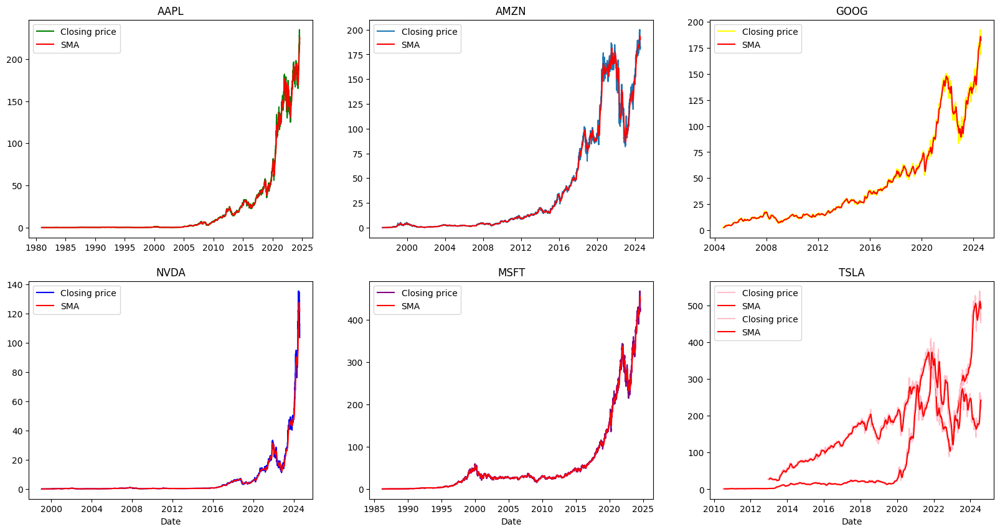

In [286]:
technicalIndicatorsVsClosingPrice(apple_data_df,amazon_data_df, google_data_df,meta_data_df,microsoft_data_df,nvdia_data_df,tesla_data_df,'SMA')
# Identifying trends, support and resistance levels. 
# A rising SMA suggests an uptrend, while a falling SMA indicates a downtrend.

#### Closing Price vs. Relative Strength Index(RSI) Indicator

c:\Users\Tegbabu\sentiment-analysis-stock-week1\notebooks\../scripts\sentimental_analysis.py:285: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



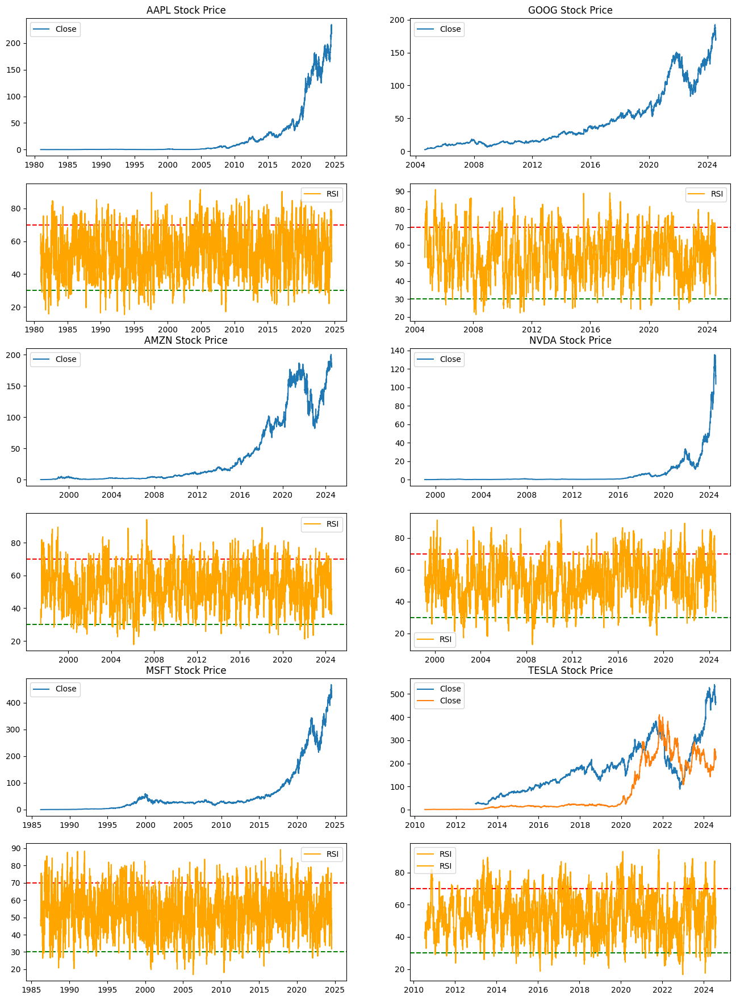

In [287]:
from sentimental_analysis import closingPriceRelativeStrengthIndex
closingPriceRelativeStrengthIndex(apple_data_df,amazon_data_df, google_data_df,meta_data_df,microsoft_data_df,nvdia_data_df,tesla_data_df)

#### Closing Price vs. Moving Average Convergence Divergence (MACD) Indicator

c:\Users\Tegbabu\sentiment-analysis-stock-week1\notebooks\../scripts\sentimental_analysis.py:420: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



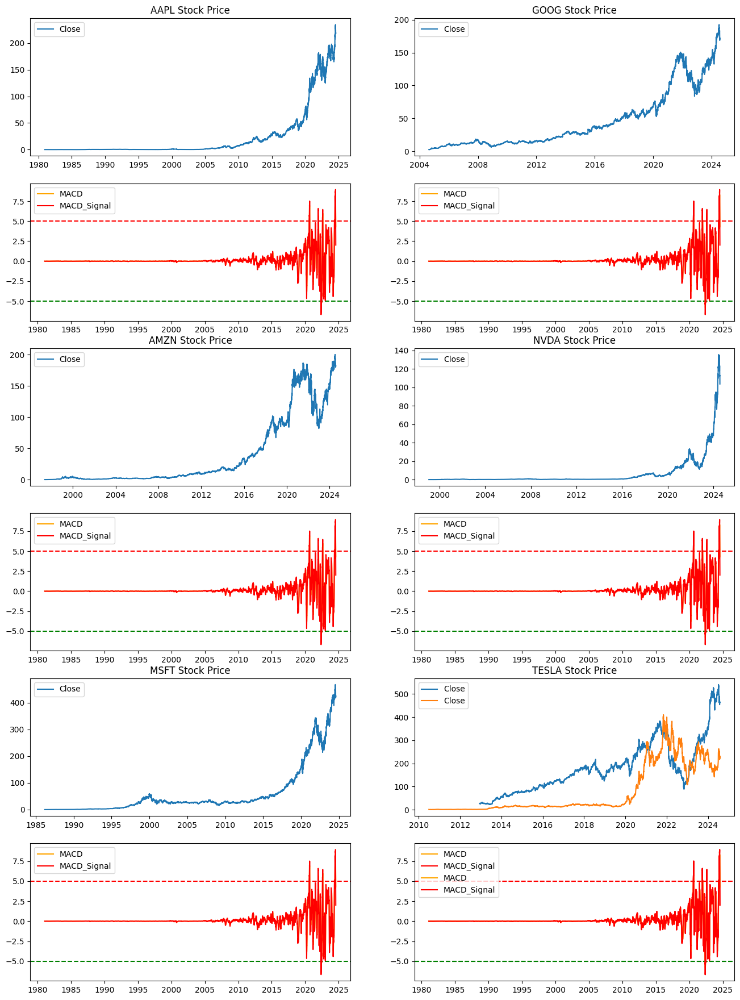

In [288]:
from sentimental_analysis import closingPriceMovingAverageConvergenceDivergence
closingPriceMovingAverageConvergenceDivergence(apple_data_df,amazon_data_df, google_data_df,meta_data_df,microsoft_data_df,nvdia_data_df,tesla_data_df)

## Financial Metrics (Portfolio analysis)

##### Between AAPL, AMZN, GOOG, META, MSFT, NVDA, TSLA

In [289]:
from sentimental_analysis import calculatePortfolioWeightAndPerformance
calculatePortfolioWeightAndPerformance()

Portfolio Weights:
{'AAPL': 0.09, 'AMZN': 0.09, 'GOOG': 0.24, 'META': 0.2, 'MSFT': 0.09, 'NVDA': 0.17, 'TSLA': 0.12}

Portfolio Performance:
Expected annual return: 28.1%
Annual volatility: 16.1%
Sharpe Ratio: 1.75


c:\Users\Tegbabu\sentiment-analysis-stock-week1\.venv\Lib\site-packages\pypfopt\expected_returns.py:32: UserWarning:

Some returns are NaN. Please check your price data.



## Correlation between news sentiment and stock price

In [290]:
#Renaming the Date to date in the stock data
apple_data_df = apple_data_df.rename(columns={'Date': 'date'})
amazon_data_df = amazon_data_df.rename(columns={'Date': 'date'})
google_data_df = google_data_df.rename(columns={'Date': 'date'})
meta_data_df = meta_data_df.rename(columns={'Date': 'date'})
microsoft_data_df = microsoft_data_df.rename(columns={'Date': 'date'})
nvdia_data_df = nvdia_data_df.rename(columns={'Date': 'date'})
tesla_data_df = tesla_data_df.rename(columns={'Date': 'date'})

#### Calculate average daily sentiment scores

In [291]:
news_data_df = pd.read_csv("../data/processed/filtered__news_data.csv")

aggregated_sentiment = news_data_df.groupby('date')['Sentiment'].mean()
aggregated_sentiment = pd.DataFrame(aggregated_sentiment)

In [292]:
aggregated_sentiment

,Sentiment
date,
2010-04-06 04:00:00+00:00,0.000000
2011-03-03 04:00:00+00:00,-0.571900
2011-03-07 04:00:00+00:00,-0.290300
2011-03-08 04:00:00+00:00,-0.018025
2011-03-09 04:00:00+00:00,0.000000
...,...
2020-06-10 17:18:50+00:00,0.177900
2020-06-10 19:08:09+00:00,0.817600
2020-06-10 19:25:13+00:00,0.000000


### Drop sentiment_score from new and replace with aggregated_sentiment




In [293]:
news_data_df = news_data_df.drop('Sentiment', axis=1)

##### Merge the aggregated to the news dataframe

In [294]:
news_data_and_aggregate_sentiment = pd.merge(aggregated_sentiment, news_data_df, how='inner', on='date')

In [295]:
news_data_and_aggregate_sentiment.head()

,date,Sentiment,Unnamed: 0,headline,url,publisher,stock,headline_length,date_x,sentiment_score_word,publication_date,publication_hour,is_email,domain
0,2010-04-06 04:00:00+00:00,0.000000,861780,daily small cap market news and stock h...,https://www.benzinga.com/208992/4-6-10-daily-s...,SmallCapVoice,MSF,78,2010-04-06,Neutral,2010-04-06,4,False,NaN
1,2011-03-03 04:00:00+00:00,-0.571900,932188,nvidia goes negative nvda,https://www.benzinga.com/market-update/11/03/9...,Scott Rubin,NVDA,27,2011-03-03,Negative,2011-03-03,4,False,NaN
2,2011-03-07 04:00:00+00:00,-0.290300,932186,goldman sachs gives color on semiconductors n...,https://www.benzinga.com/analyst-ratings/analy...,Benzinga Staff,NVDA,60,2011-03-07,Neutral,2011-03-07,4,False,NaN
3,2011-03-07 04:00:00+00:00,-0.290300,932187,auriga still not sure where reality lies for n...,https://www.benzinga.com/analyst-ratings/analy...,BenzingaStaffB,NVDA,51,2011-03-07,Negative,2011-03-07,4,False,NaN
4,2011-03-08 04:00:00+00:00,-0.018025,932182,jpm says our bearish view on the company s ex...,https://www.benzinga.com/analyst-ratings/analy...,Benzinga Staff,NVDA,74,2011-03-08,Negative,2011-03-08,4,False,NaN


### Remove the timezone of news and merge with stock price

In [296]:
news_data_and_aggregate_sentiment['date'].tail(10)

7321    2020-06-10 16:12:25+00:00
7322    2020-06-10 16:37:10+00:00
7323    2020-06-10 16:41:58+00:00
7324    2020-06-10 17:18:50+00:00
7325    2020-06-10 17:18:50+00:00
7326    2020-06-10 19:08:09+00:00
7327    2020-06-10 19:25:13+00:00
7328    2020-06-10 19:25:13+00:00
7329    2020-06-10 20:20:19+00:00
7330    2020-06-10 21:02:47+00:00
Name: date, dtype: object

In [297]:
# First: Ensure the columns are datetime
news_data_and_aggregate_sentiment['date'] = pd.to_datetime(news_data_and_aggregate_sentiment['date'])
apple_data_df['date'] = pd.to_datetime(apple_data_df['date'])
amazon_data_df['date'] = pd.to_datetime(amazon_data_df['date'])
google_data_df['date'] = pd.to_datetime(google_data_df['date'])
meta_data_df['date'] = pd.to_datetime(meta_data_df['date'])
microsoft_data_df['date'] = pd.to_datetime(microsoft_data_df['date'])
nvdia_data_df['date'] = pd.to_datetime(nvdia_data_df['date'])
tesla_data_df['date'] = pd.to_datetime(tesla_data_df['date'])

# Optional: remove timezone info if needed
news_data_and_aggregate_sentiment['date'] = news_data_and_aggregate_sentiment['date'].dt.tz_localize(None)
apple_data_df['date'] = apple_data_df['date'].dt.tz_localize(None)
amazon_data_df['date'] = amazon_data_df['date'].dt.tz_localize(None)
google_data_df['date'] = google_data_df['date'].dt.tz_localize(None)
meta_data_df['date'] = meta_data_df['date'].dt.tz_localize(None)
microsoft_data_df['date'] = microsoft_data_df['date'].dt.tz_localize(None)
nvdia_data_df['date'] = nvdia_data_df['date'].dt.tz_localize(None)
tesla_data_df['date'] = tesla_data_df['date'].dt.tz_localize(None)


# Normalize to remove time part but keep datetime type (not plain date)
news_data_and_aggregate_sentiment['date'] = news_data_and_aggregate_sentiment['date'].dt.normalize()
apple_data_df['date'] = apple_data_df['date'].dt.normalize()
amazon_data_df['date'] = amazon_data_df['date'].dt.normalize()
google_data_df['date'] = google_data_df['date'].dt.normalize()
meta_data_df['date'] = meta_data_df['date'].dt.normalize()
microsoft_data_df['date'] = microsoft_data_df['date'].dt.normalize()
nvdia_data_df['date'] = nvdia_data_df['date'].dt.normalize()
tesla_data_df['date'] = tesla_data_df['date'].dt.normalize()

# Merge
mergeStockAndNews_app = news_data_and_aggregate_sentiment.merge(apple_data_df, how='inner', on='date')
mergeStockAndNews_amz = news_data_and_aggregate_sentiment.merge(amazon_data_df, how='inner', on='date')
mergeStockAndNews_goog = news_data_and_aggregate_sentiment.merge(google_data_df, how='inner', on='date')
mergeStockAndNews_meta = news_data_and_aggregate_sentiment.merge(meta_data_df, how='inner', on='date')
mergeStockAndNews_msft = news_data_and_aggregate_sentiment.merge(microsoft_data_df, how='inner', on='date')
mergeStockAndNews_nvda = news_data_and_aggregate_sentiment.merge(nvdia_data_df, how='inner', on='date')
mergeStockAndNews_tsla = news_data_and_aggregate_sentiment.merge(tesla_data_df, how='inner', on='date')

In [298]:
mergeStockAndNews_app = mergeStockAndNews_app.dropna()
mergeStockAndNews_amz = mergeStockAndNews_amz.dropna()
mergeStockAndNews_goog = mergeStockAndNews_goog.dropna()
mergeStockAndNews_meta = mergeStockAndNews_meta.dropna()
mergeStockAndNews_msft = mergeStockAndNews_msft.dropna()
mergeStockAndNews_nvda = mergeStockAndNews_nvda.dropna()
mergeStockAndNews_tsla = mergeStockAndNews_tsla.dropna()

#### Calculate daily stock returns

In [299]:
# Calculate daily stock returns for each comppany
mergeStockAndNews_app['stock_return'] = mergeStockAndNews_app['Close'].pct_change()
mergeStockAndNews_amz['stock_return'] = mergeStockAndNews_amz['Close'].pct_change()
mergeStockAndNews_goog['stock_return'] = mergeStockAndNews_goog['Close'].pct_change()
mergeStockAndNews_meta['stock_return'] = mergeStockAndNews_meta['Close'].pct_change()
mergeStockAndNews_msft['stock_return'] = mergeStockAndNews_msft['Close'].pct_change()
mergeStockAndNews_nvda['stock_return'] = mergeStockAndNews_nvda['Close'].pct_change()
mergeStockAndNews_tsla['stock_return'] = mergeStockAndNews_tsla['Close'].pct_change()

In [300]:
# Correlation analysis
correlation_1 = mergeStockAndNews_app[['Sentiment', 'stock_return']].corr()
correlation_2 = mergeStockAndNews_amz[['Sentiment', 'stock_return']].corr()
correlation_3 = mergeStockAndNews_goog[['Sentiment', 'stock_return']].corr()
correlation_4 = mergeStockAndNews_meta[['Sentiment', 'stock_return']].corr()
correlation_5 = mergeStockAndNews_msft[['Sentiment', 'stock_return']].corr()
correlation_6 = mergeStockAndNews_nvda[['Sentiment', 'stock_return']].corr()
correlation_7 = mergeStockAndNews_tsla[['Sentiment', 'stock_return']].corr()

#### Plot the Correlation between aggregate sentiment and daily returns for each company

In [301]:
import seaborn as sns

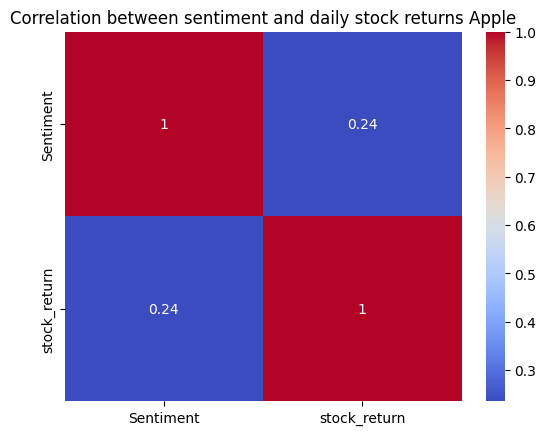

In [302]:

sns.heatmap(correlation_1, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns Apple')
plt.show()

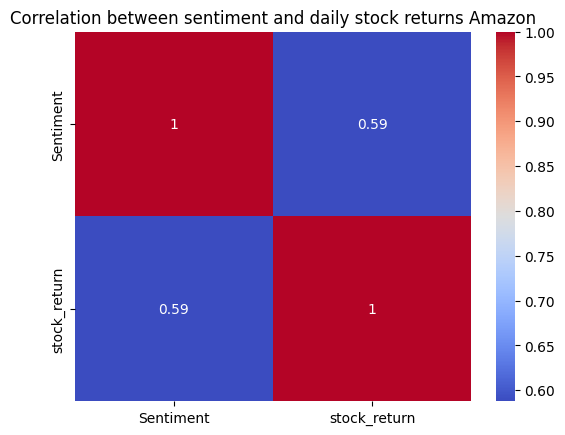

In [303]:
sns.heatmap(correlation_2, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns Amazon')
plt.show()

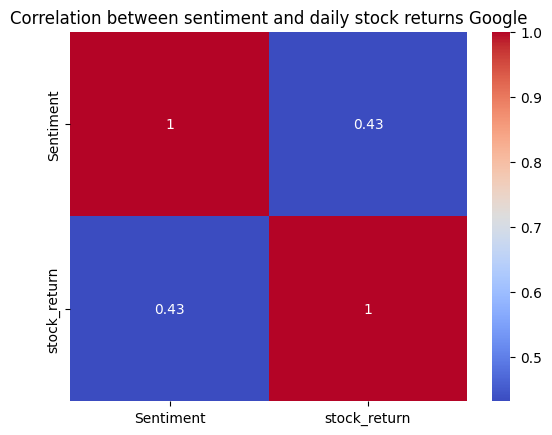

In [304]:
sns.heatmap(correlation_3, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns Google')
plt.show()

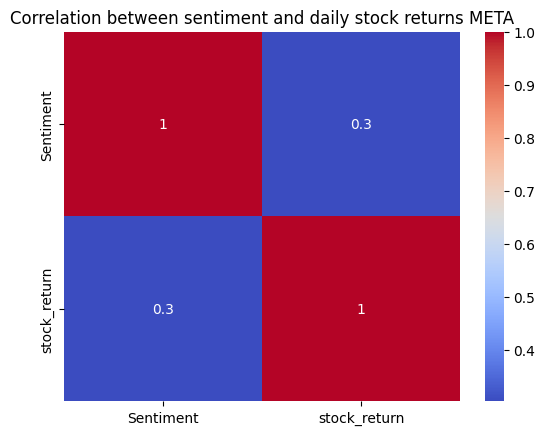

In [305]:
sns.heatmap(correlation_4, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns META')
plt.show()

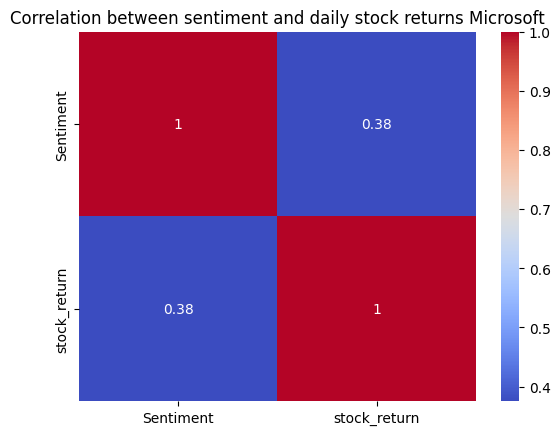

In [306]:
sns.heatmap(correlation_5, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns Microsoft')
plt.show()

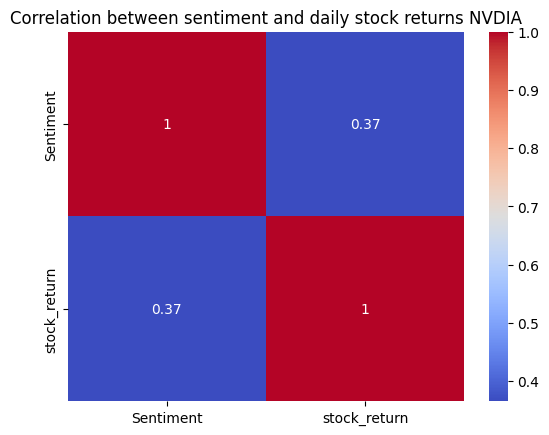

In [307]:
sns.heatmap(correlation_6, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns NVDIA')
plt.show()

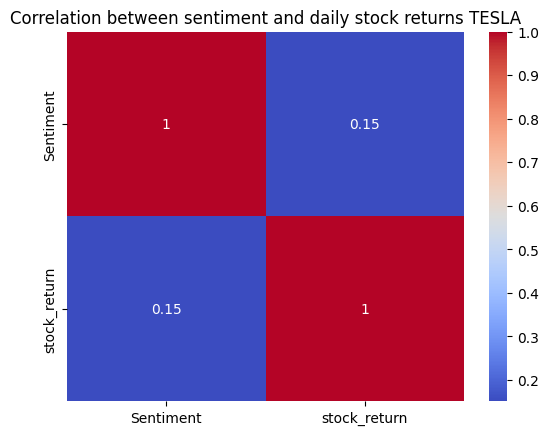

In [308]:
sns.heatmap(correlation_7, annot=True, cmap='coolwarm')
plt.title('Correlation between sentiment and daily stock returns TESLA')
plt.show()

The above correlation shows the Pearson correlation coefficients between the two variables: Sentiment and stock_return.It describes the strength and direction of the linear relationship between sentiment and stock returns for each company. 

### General Observations:
    Amazon (0.58) and Google (0.43) show the strongest correlation, implying that public sentiment could be moderately useful for predicting short-term return patterns.

    Tesla (0.15) stands out as least influenced by sentiment, which aligns with its often unpredictable price behavior and influence from broader macro and Elon Musk-driven factors.

    Most companies fall in the weak to moderate range (0.24–0.37), indicating that while sentiment has some influence, it’s far from a sole driver.